In [1]:
import os
import numpy as np
import scanpy as sc
import anndata as ad
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize']=(5, 5)
sc.settings.verbosity = 3
sc.logging.print_versions()
#results_file = './write/results.h5ad'


%load_ext autoreload
%autoreload 2 

scanpy==1.4.5.post3 anndata==0.6.22.post1 umap==0.3.10 numpy==1.17.4 scipy==1.3.2 pandas==0.25.3 scikit-learn==0.21.3 statsmodels==0.10.1 python-igraph==0.7.1 louvain==0.6.1


In [2]:
adata = sc.read('./sciPlex2/GSM4150377_sciPlex2_annData.h5ad')
adata.var_names_make_unique()

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [3]:
adata.obs['drug'] = [i.split('_')[0] for i in adata.obs['top_oligo']]
adata = adata[adata.obs['drug'] != 'NA']
adata.obs['dose'] = [i.split('_')[1] for i in adata.obs['top_oligo']]
adata.obs['dose'] = adata.obs['dose'].apply(pd.to_numeric, args=('coerce',))

Trying to set attribute `.obs` of view, making a copy.


In [4]:
print(adata.obs['drug'].value_counts())
print('')

Dex       8064
Nutlin    5956
SAHA      5530
BMS       4183
Name: drug, dtype: int64



In [5]:
adata.obs['vehicle'] = (adata.obs['dose'] == 0.0)

In [6]:
adata.obs['vehicle'].value_counts()

False    19832
True      3901
Name: vehicle, dtype: int64

In [7]:
adata.obs['vehicle'] = adata.obs['vehicle'].astype('category')

In [9]:
adata.obs['drug'][adata.obs['vehicle'] == True] = 'Vehicle'

/home/icb/carlo.dedonno/python/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


# QC

In [11]:
# Quality control - calculate QC covariates
adata.obs['n_counts'] = adata.X.sum(1)
adata.obs['log_counts'] = np.log(adata.obs['n_counts'])
adata.obs['n_genes'] = (adata.X > 0).sum(1)

... storing 'drug' as categorical


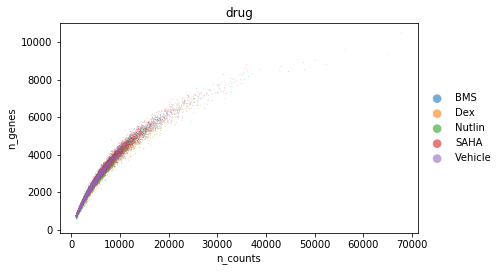

In [12]:
#Data quality summary plots
#plt.rcParams['figure.figsize'] = (10, 10)
p1 = sc.pl.scatter(adata, 'n_counts', 'n_genes', size=2, color='drug', alpha=0.6)

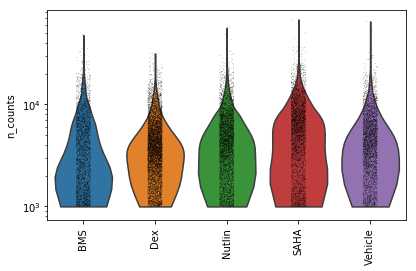

In [13]:
# Quality control - plot QC metrics
#Sample quality plots
t1 = sc.pl.violin(adata, 'n_counts', groupby='drug', size=0.5, log=True, cut=0, rotation=90)
#t2 = sc.pl.violin(adata, 'mt_frac', groupby='sample')

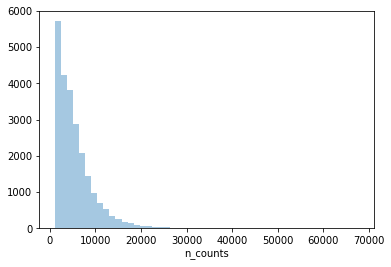

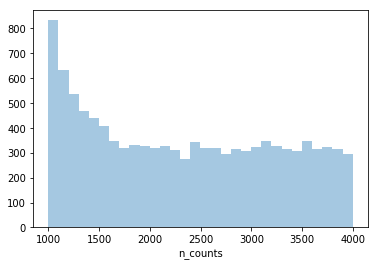

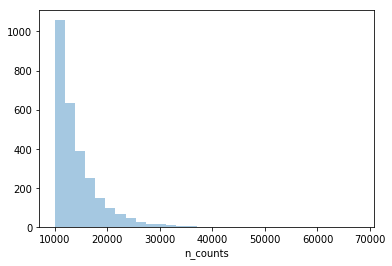

In [14]:
#Thresholding decision: counts
plt.figure()
sns.distplot(adata.obs['n_counts'], kde=False)
plt.figure()
sns.distplot(adata.obs['n_counts'][adata.obs['n_counts']<4000], kde=False, bins=30)
plt.figure()
sns.distplot(adata.obs['n_counts'][adata.obs['n_counts']>10000], kde=False, bins=30)

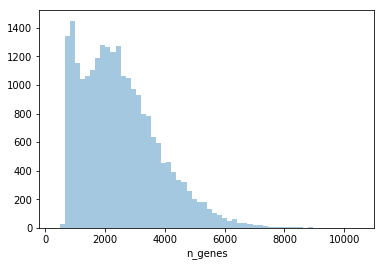

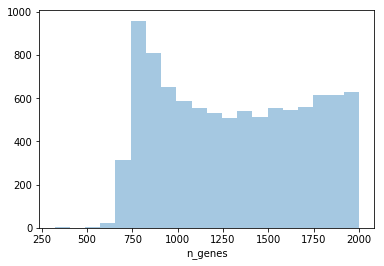

In [15]:
#Thresholding decision: genes
plt.figure()
sns.distplot(adata.obs['n_genes'], kde=False, bins=60)
plt.figure()
sns.distplot(adata.obs['n_genes'][adata.obs['n_genes']<2000], kde=False, bins=20)

In [16]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, min_counts = 500)
print('Number of cells after min count filter: {:d}'.format(adata.n_obs))
sc.pp.filter_cells(adata, min_genes = 750)

Total number of cells: 23733
Number of cells after min count filter: 23733
filtered out 434 cells that have less than 750 genes expressed


In [17]:
print('Total number of genes: {:d}'.format(adata.n_vars))

# Min 20 cells - filters out 0 count genes
sc.pp.filter_genes(adata, min_cells=100)
print('Number of genes after cell filter: {:d}'.format(adata.n_vars))

Total number of genes: 58347
filtered out 39650 genes that are detected in less than 100 cells
Number of genes after cell filter: 18697


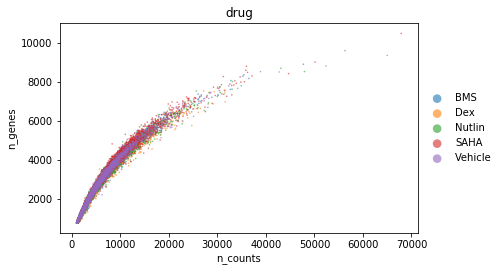

In [18]:
#Data quality summary plots
p1 = sc.pl.scatter(adata, 'n_counts', 'n_genes', size=10, color='drug', alpha=0.6)

# Normalization

In [19]:
#Keep the count data in a counts layer
adata.layers["counts"] = adata.X.copy()

In [20]:
#Normalize adata 
adata.X /= adata.obs['size_factor'].values[:,None]
sc.pp.log1p(adata)

In [21]:
# Store the full data set in 'raw' as log-normalised data for statistical testing
adata.raw = adata

# HVG

In [22]:
import scipy
adata.X = scipy.sparse.csr_matrix(adata.X)
sc.pp.highly_variable_genes(adata, flavor='cell_ranger', n_top_genes=4000, subset=True)
print('\n','Number of highly variable genes: {:d}'.format(np.sum(adata.var['highly_variable'])))

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)

 Number of highly variable genes: 4000


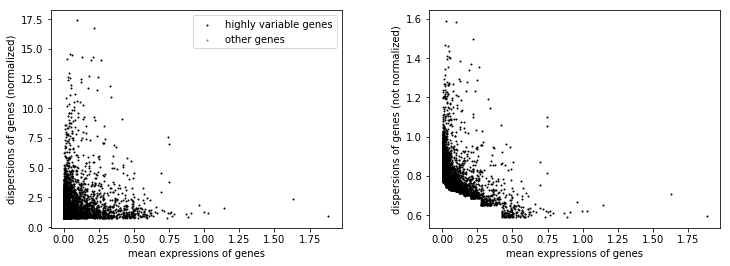

In [23]:
sc.pl.highly_variable_genes(adata)

# Visualization

In [24]:
# Calculate the visualizations
sc.pp.pca(adata, n_comps=50, use_highly_variable=True, svd_solver='arpack')
sc.pp.neighbors(adata)

sc.tl.umap(adata)

computing PCA with n_comps = 50
    on highly variable genes
    finished (0:00:13)
computing neighbors
    using 'X_pca' with n_pcs = 50


/home/icb/carlo.dedonno/python/lib/python3.6/site-packages/numba/typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../python/lib/python3.6/site-packages/umap/rp_tree.py", line 135:
@numba.njit(fastmath=True, nogil=True, parallel=True)
def euclidean_random_projection_split(data, indices, rng_state):
^

  state.func_ir.loc))
/home/icb/carlo.dedonno/python/lib/python3.6/site-packages/umap/nndescent.py:92: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../python/lib/python3.6/site-packages/umap/utils.py", l

    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:09)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:22)


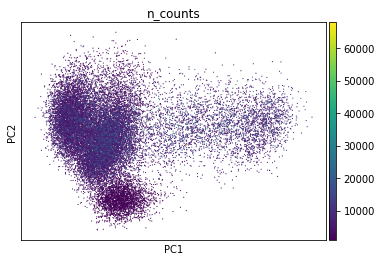

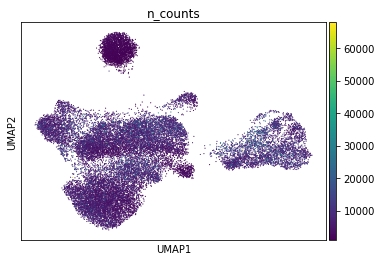

In [25]:
sc.pl.pca_scatter(adata, color='n_counts')
sc.pl.umap(adata, color='n_counts')

In [26]:
adata.obs['dose'] = adata.obs['dose'].astype(str)
adata.obs['product_dose'] = adata.obs[['drug', 'dose']].apply(lambda x: ' '.join(x), axis=1)

... storing 'dose' as categorical
... storing 'product_dose' as categorical


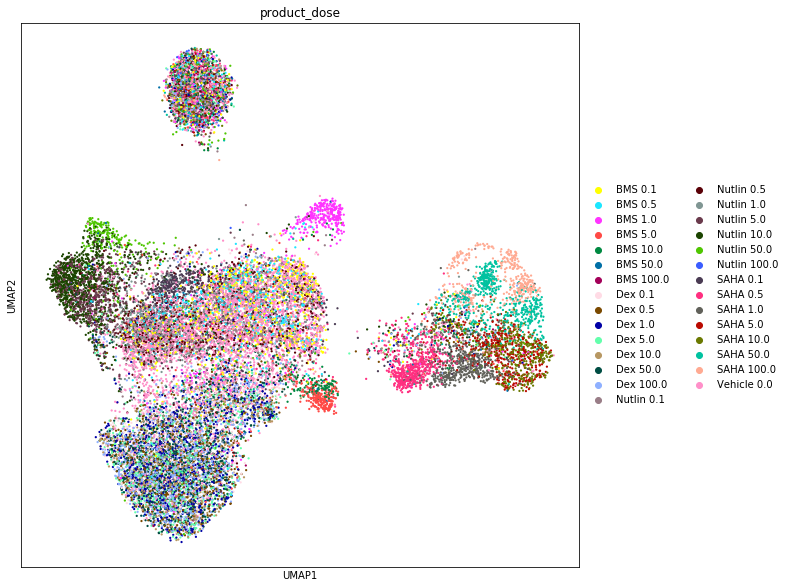

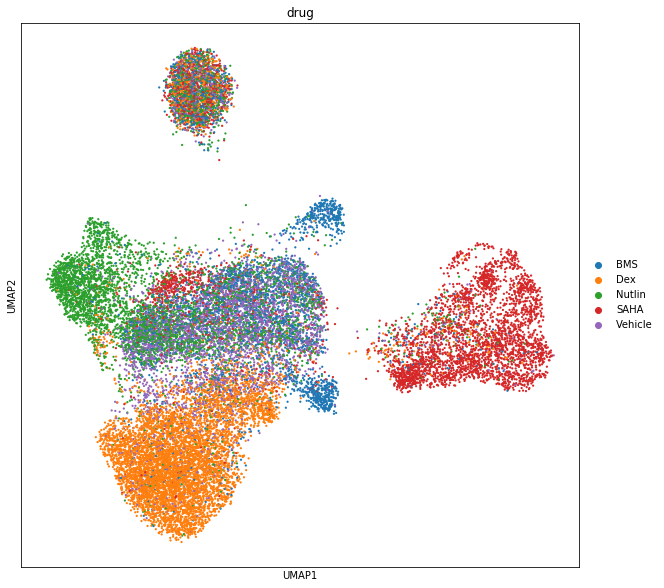

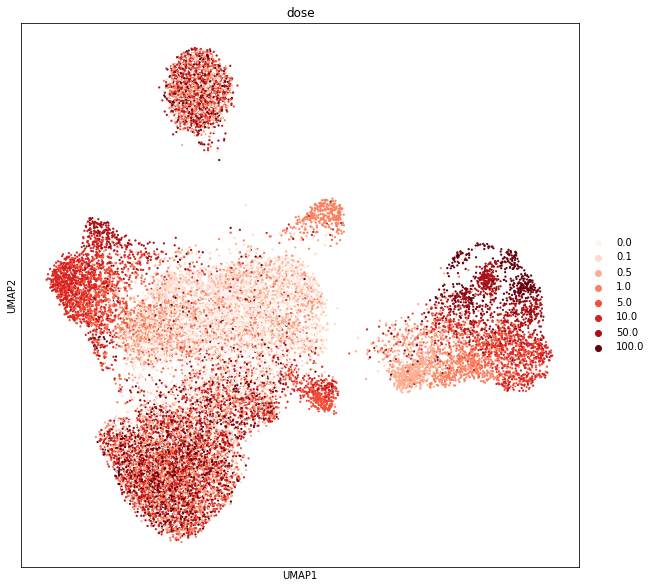

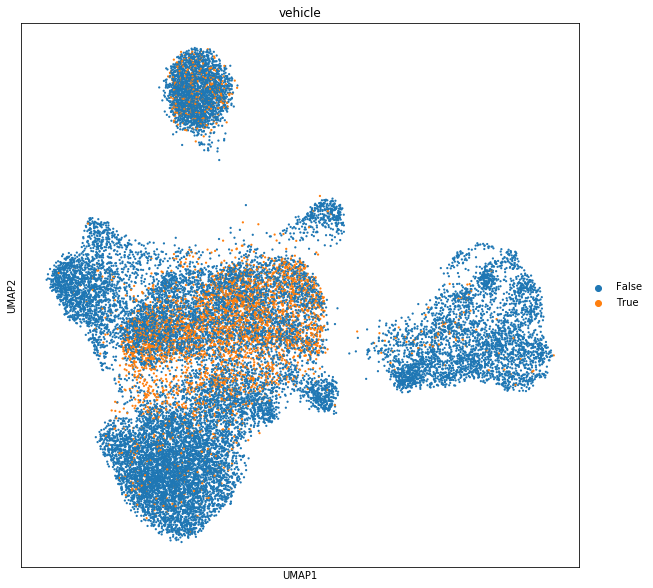

In [27]:
plt.rcParams['figure.figsize'] = (10, 10)
sc.pl.umap(adata, color='product_dose', color_map=sc.pl.palettes.default_20, size=20)
sc.pl.umap(adata, color='drug', color_map=sc.pl.palettes.default_20, size=20)
sc.pl.umap(adata, color='dose', size=20, palette='Reds')
sc.pl.umap(adata, color='vehicle', size=20)

In [28]:
import scgen as scg

Using TensorFlow backend.
/home/icb/carlo.dedonno/python/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:526: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/icb/carlo.dedonno/python/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:527: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/icb/carlo.dedonno/python/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:528: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/home/icb/carlo.dedonno/python/l

In [29]:
from sklearn.model_selection import train_test_split 

train_data, valid_data = train_test_split(adata, test_size=0.1, random_state=42)

Instructions for updating:
Colocations handled automatically by placer.
Model: "VAE"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input (InputLayer)           (None, 4000)              0         
_________________________________________________________________
encoder (Model)              (None, 2)                 3849604   
_________________________________________________________________
decoder (Model)              (None, 4000)              3852000   
Total params: 7,701,604
Trainable params: 7,695,204
Non-trainable params: 6,400
_________________________________________________________________
Instructions for updating:
Use tf.cast instead.
Epoch 1/10
20969/20969 [==============================] - 5s 237us/step - loss: 692.9555 - kl_loss: 9220247.0000 - recon_loss: 231.9433
Epoch 2/10
20969/20969 [==============================] - 4s 213us/step - loss: 906.0570 - kl_loss: 14885900.0000 - recon_l

/home/icb/carlo.dedonno/python/lib/python3.6/site-packages/numba/typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../python/lib/python3.6/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


/home/icb/carlo.dedonno/python/lib/python3.6/site-packages/matplotlib/font_manager.py:1241: UserWarning: findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))


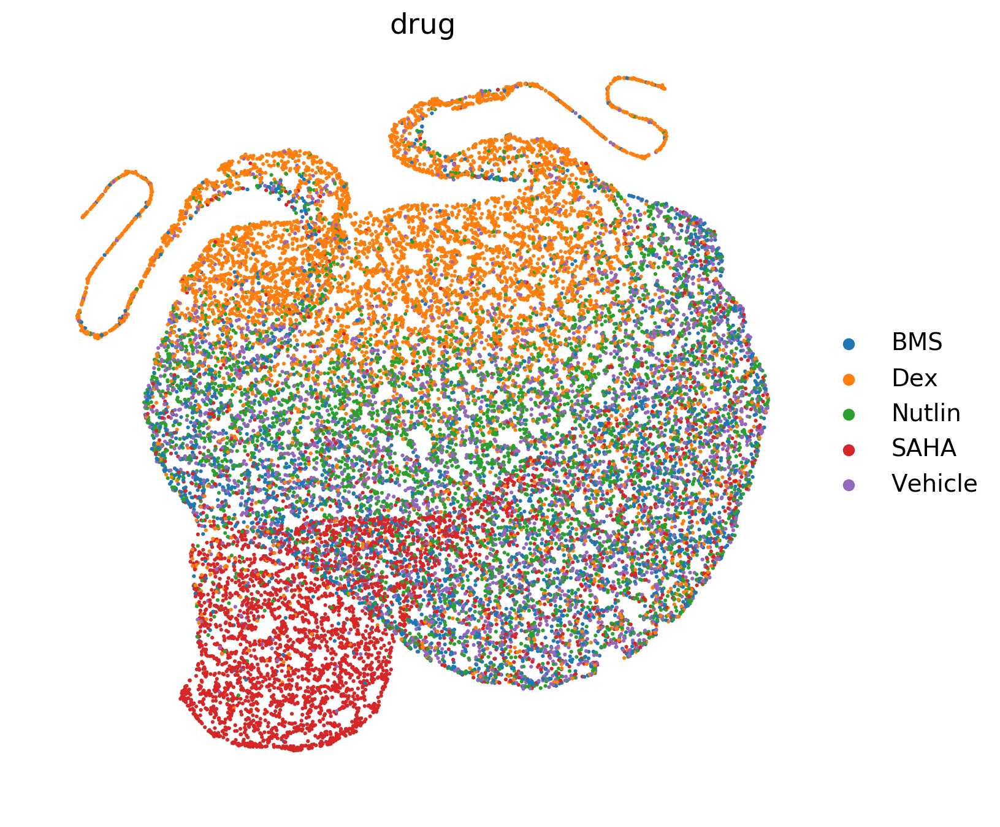

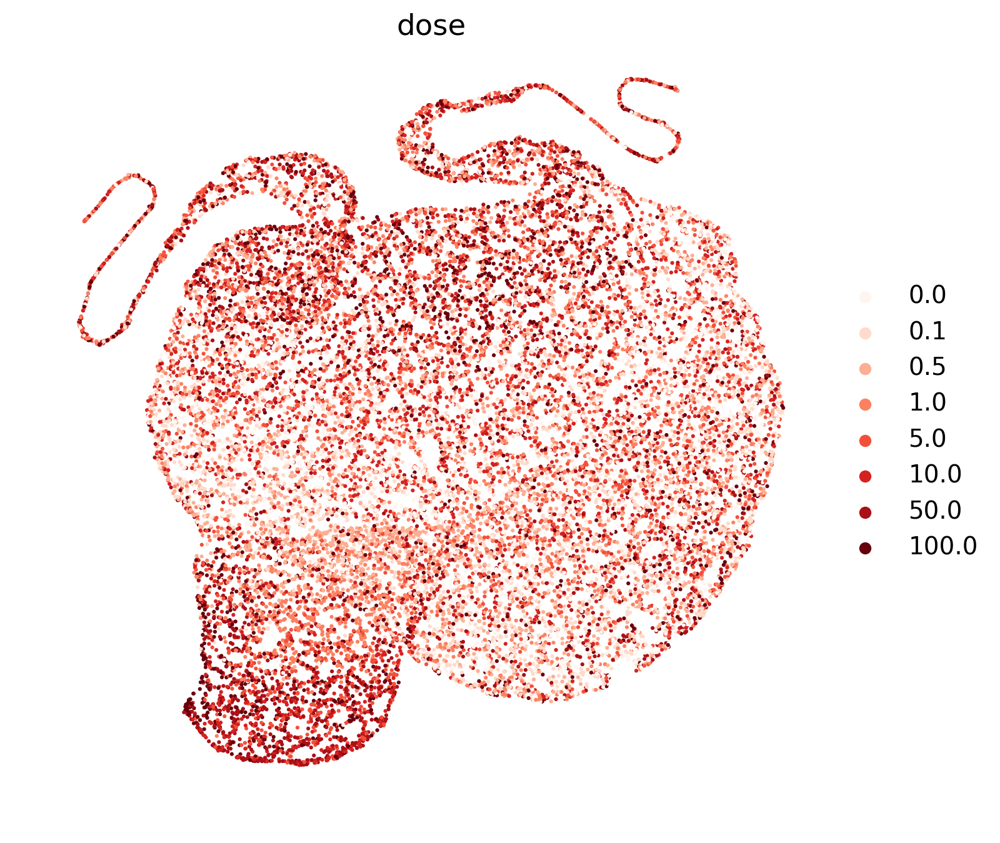

Model: "VAE"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input (InputLayer)           (None, 4000)              0         
_________________________________________________________________
encoder (Model)              (None, 16)                3872032   
_________________________________________________________________
decoder (Model)              (None, 4000)              3863200   
Total params: 7,735,232
Trainable params: 7,728,832
Non-trainable params: 6,400
_________________________________________________________________
Epoch 1/10
20969/20969 [==============================] - 5s 230us/step - loss: 224.4841 - kl_loss: 176864.6719 - recon_loss: 215.6409
Epoch 2/10
20969/20969 [==============================] - 4s 199us/step - loss: 249053.7093 - kl_loss: 4977946112.0000 - recon_loss: 156.3470
Epoch 3/10
20969/20969 [==============================] - 4s 200us/step - loss: 140.9435 - kl_loss: 13

/home/icb/carlo.dedonno/python/lib/python3.6/site-packages/numba/typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../python/lib/python3.6/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


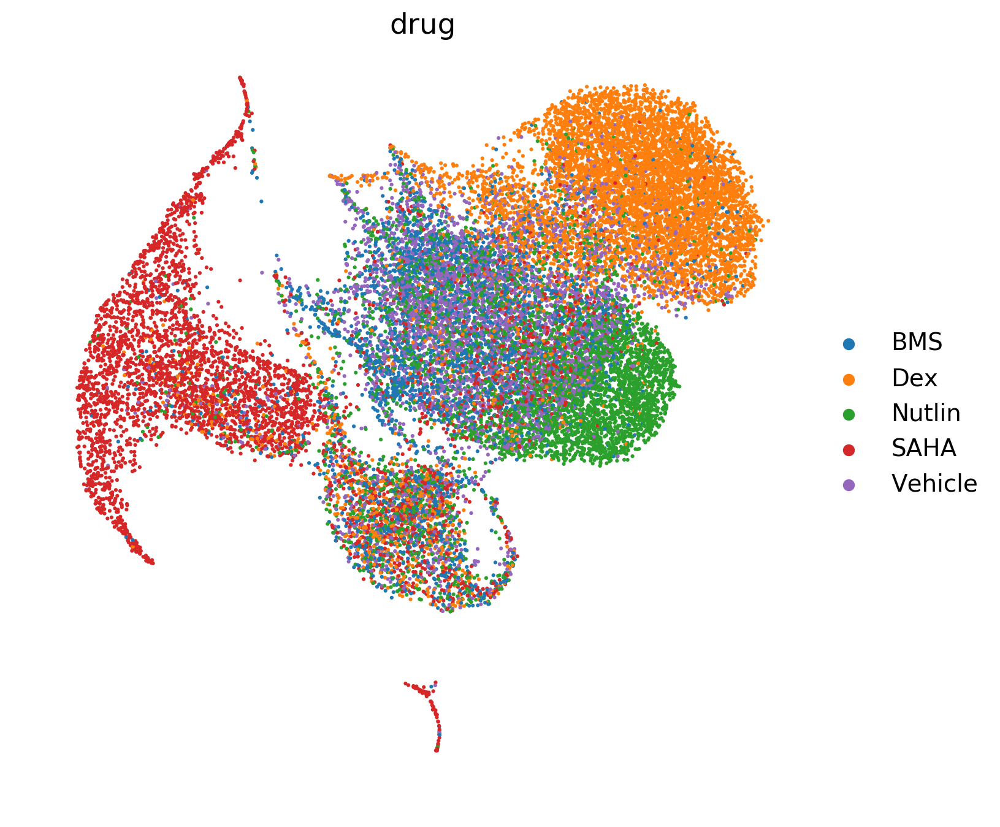

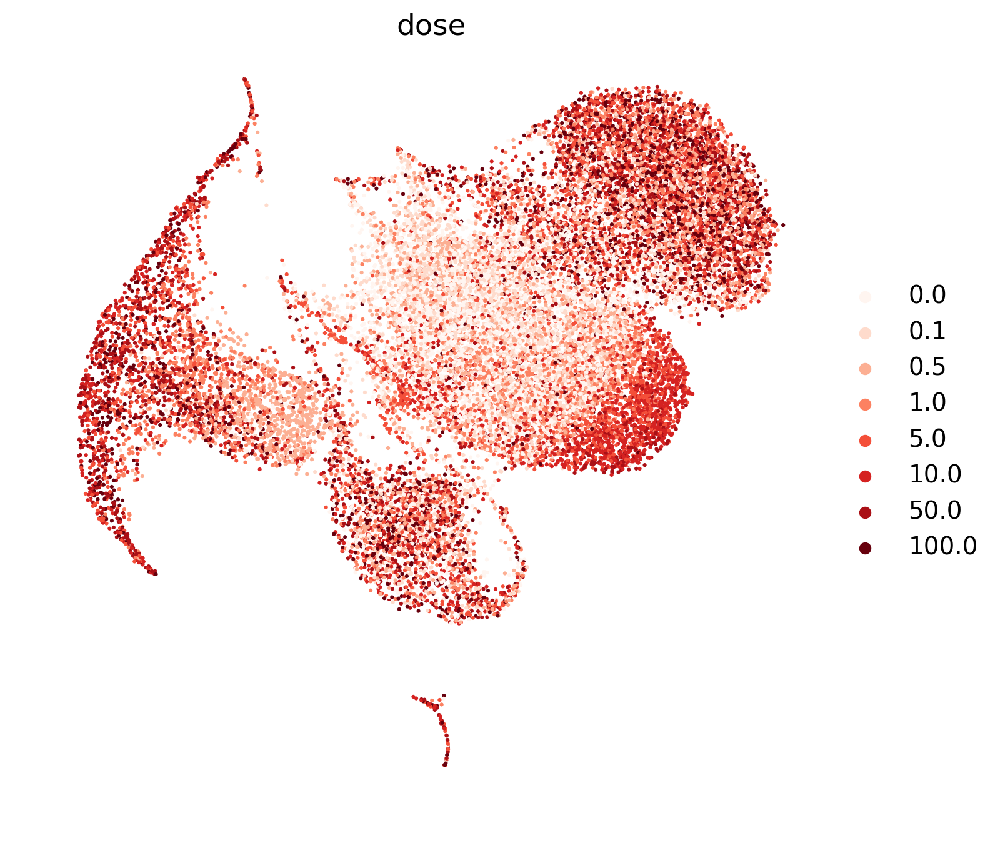

Model: "VAE"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input (InputLayer)           (None, 4000)              0         
_________________________________________________________________
encoder (Model)              (None, 64)                3948928   
_________________________________________________________________
decoder (Model)              (None, 4000)              3901600   
Total params: 7,850,528
Trainable params: 7,844,128
Non-trainable params: 6,400
_________________________________________________________________
Epoch 1/10
20969/20969 [==============================] - 5s 238us/step - loss: 224.5091 - kl_loss: 155158.6406 - recon_loss: 216.7512
Epoch 2/10
20969/20969 [==============================] - 4s 198us/step - loss: 144.8036 - kl_loss: 34838.5625 - recon_loss: 143.0617
Epoch 3/10
20969/20969 [==============================] - 4s 200us/step - loss: 133.6767 - kl_loss: 3463.1567 

/home/icb/carlo.dedonno/python/lib/python3.6/site-packages/numba/typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../python/lib/python3.6/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


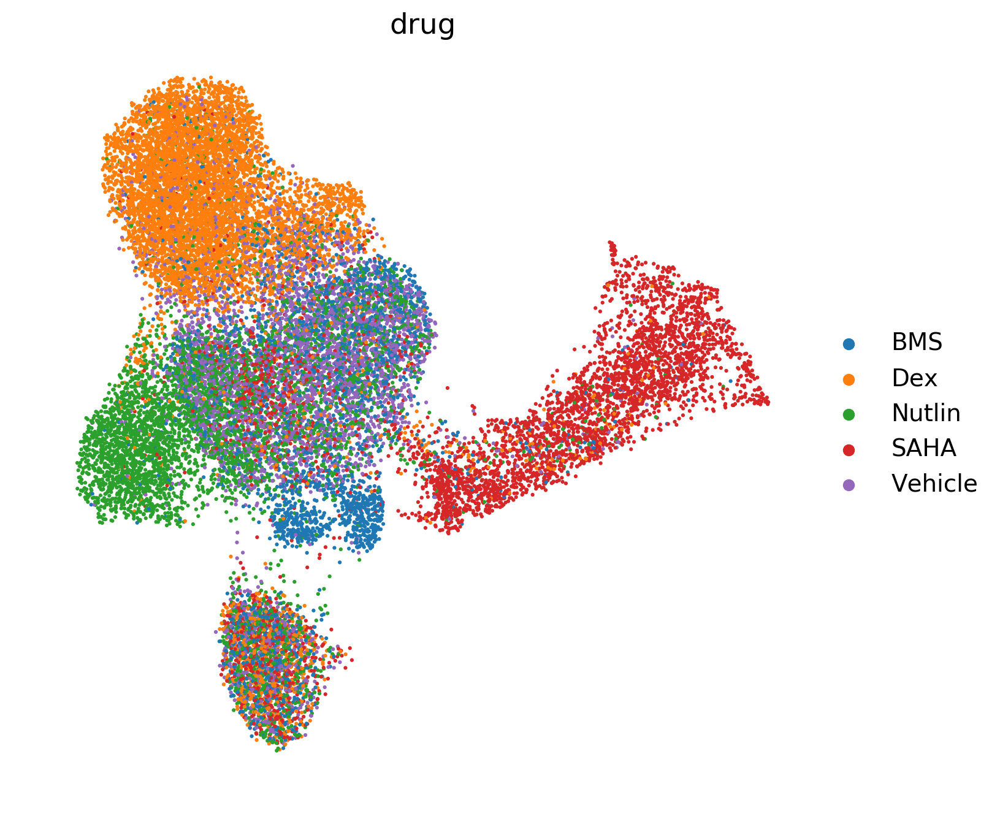

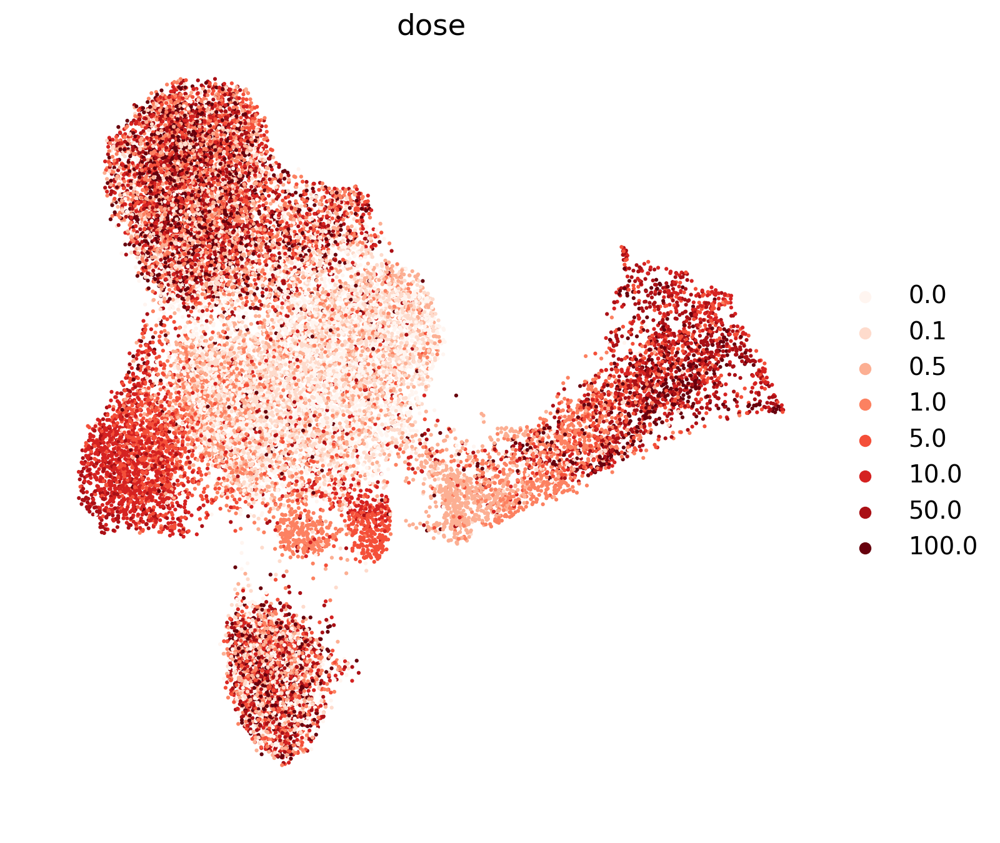

Model: "VAE"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input (InputLayer)           (None, 4000)              0         
_________________________________________________________________
encoder (Model)              (None, 128)               4051456   
_________________________________________________________________
decoder (Model)              (None, 4000)              3952800   
Total params: 8,004,256
Trainable params: 7,997,856
Non-trainable params: 6,400
_________________________________________________________________
Epoch 1/10
20969/20969 [==============================] - 5s 240us/step - loss: 200.0044 - kl_loss: 13467.3848 - recon_loss: 199.3310
Epoch 2/10
20969/20969 [==============================] - 4s 204us/step - loss: 138.7757 - kl_loss: 927.0624 - recon_loss: 138.7294
Epoch 3/10
20969/20969 [==============================] - 4s 203us/step - loss: 130.0207 - kl_loss: 882.2780 - re

/home/icb/carlo.dedonno/python/lib/python3.6/site-packages/numba/typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../python/lib/python3.6/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


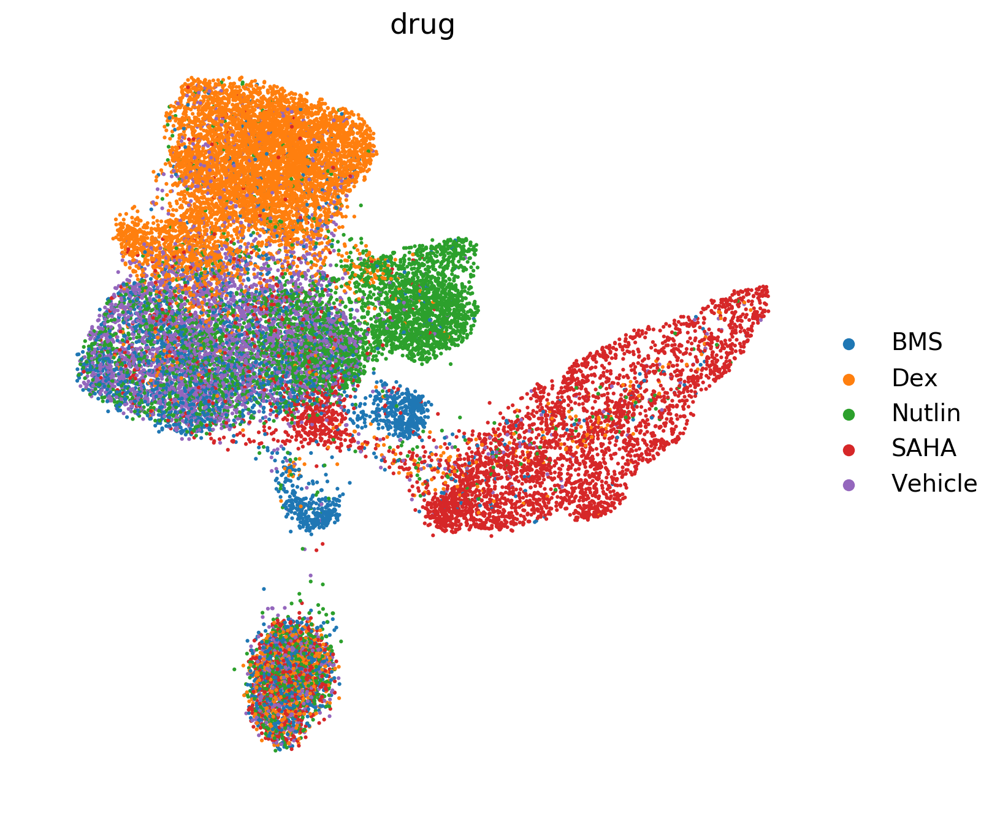

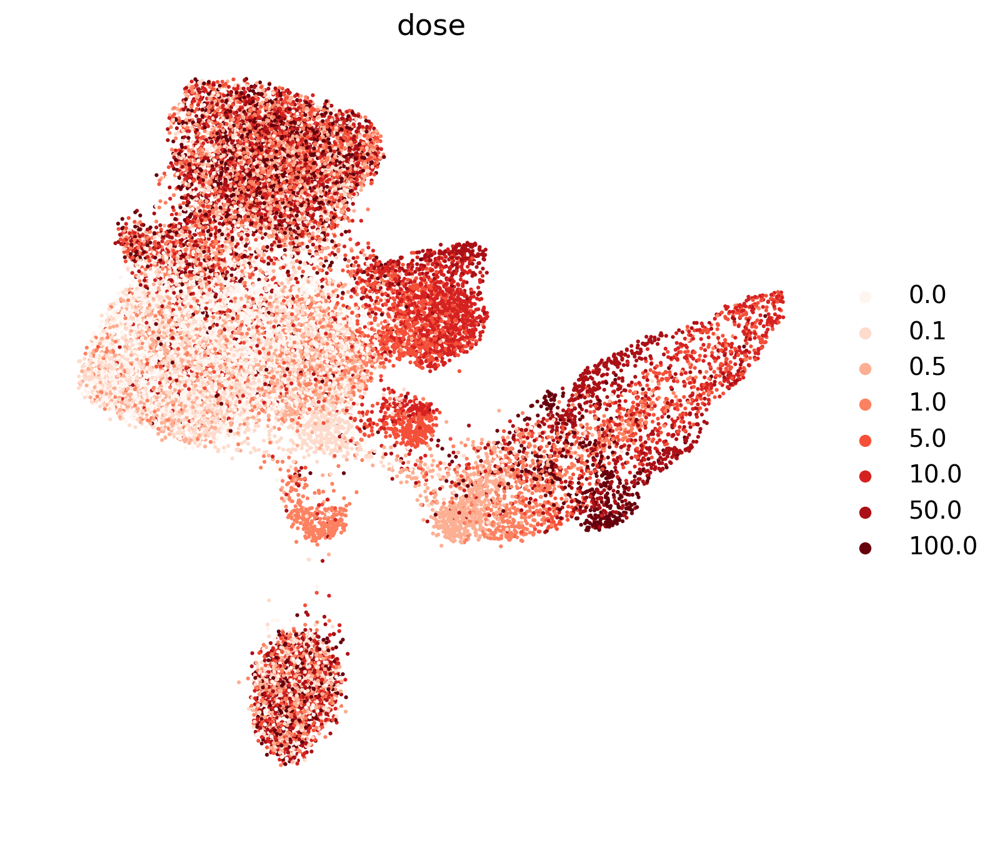

Model: "VAE"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input (InputLayer)           (None, 4000)              0         
_________________________________________________________________
encoder (Model)              (None, 512)               4666624   
_________________________________________________________________
decoder (Model)              (None, 4000)              4260000   
Total params: 8,926,624
Trainable params: 8,920,224
Non-trainable params: 6,400
_________________________________________________________________
Epoch 1/10
20969/20969 [==============================] - 6s 264us/step - loss: 198.8382 - kl_loss: 2152.6433 - recon_loss: 198.7306
Epoch 2/10
20969/20969 [==============================] - 5s 224us/step - loss: 133.4029 - kl_loss: 2285.5278 - recon_loss: 133.2886
Epoch 3/10
20969/20969 [==============================] - 5s 224us/step - loss: 126.8596 - kl_loss: 2049.2468 - r

/home/icb/carlo.dedonno/python/lib/python3.6/site-packages/numba/typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../python/lib/python3.6/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


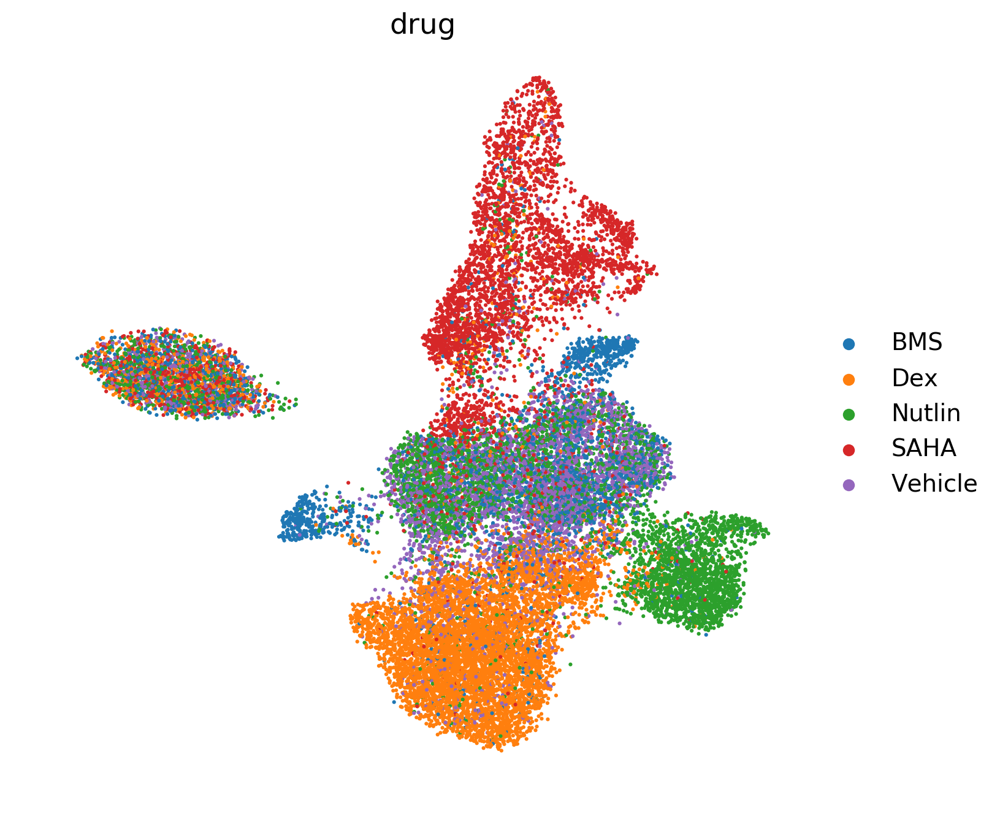

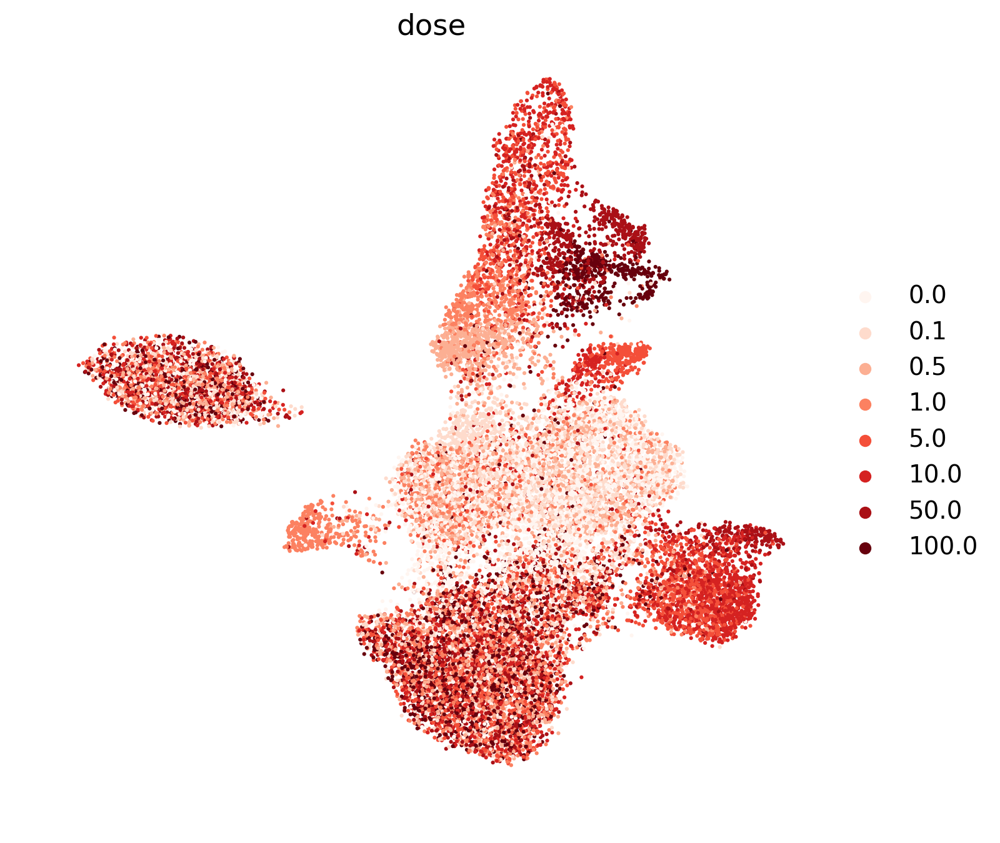

Model: "VAE"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input (InputLayer)           (None, 4000)              0         
_________________________________________________________________
encoder (Model)              (None, 1024)              5486848   
_________________________________________________________________
decoder (Model)              (None, 4000)              4669600   
Total params: 10,156,448
Trainable params: 10,150,048
Non-trainable params: 6,400
_________________________________________________________________
Epoch 1/10
20969/20969 [==============================] - 6s 285us/step - loss: 202.1193 - kl_loss: 3904.2495 - recon_loss: 201.9241
Epoch 2/10
20969/20969 [==============================] - 5s 251us/step - loss: 138.4352 - kl_loss: 3241.7251 - recon_loss: 138.2731
Epoch 3/10
20969/20969 [==============================] - 5s 261us/step - loss: 128.6161 - kl_loss: 2688.2944 -

/home/icb/carlo.dedonno/python/lib/python3.6/site-packages/numba/typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../python/lib/python3.6/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


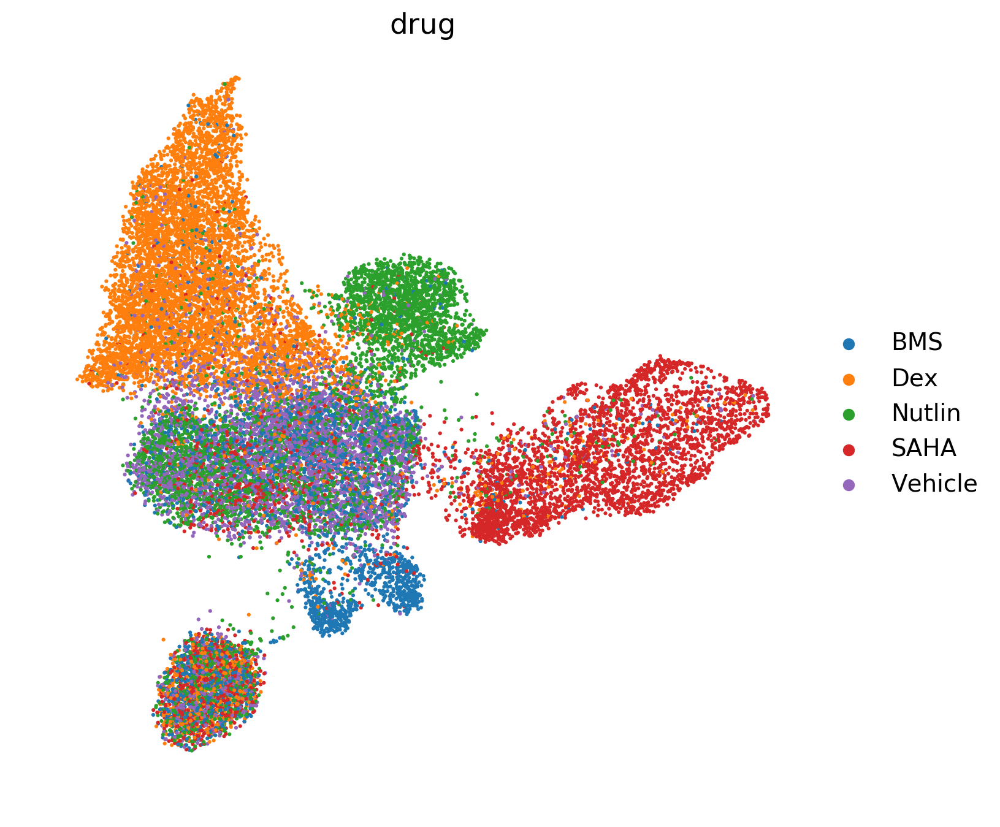

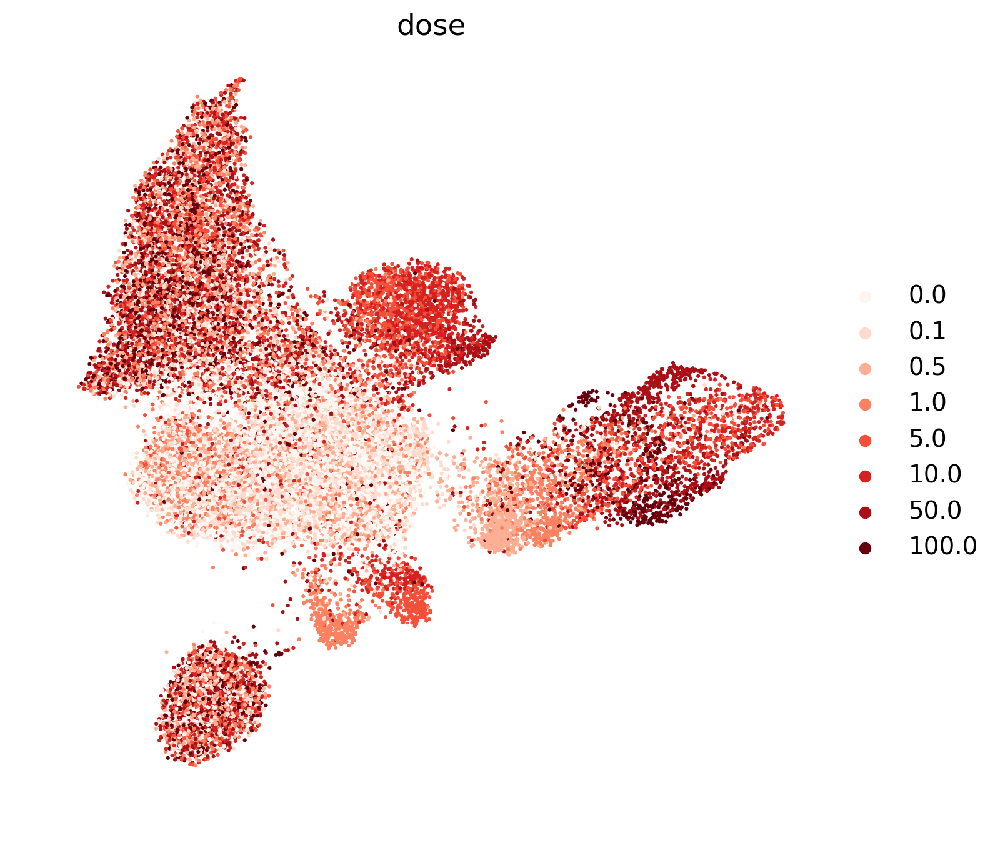

In [30]:
import umap
plt.rcParams['figure.figsize'] = (8, 8)
plt.rcParams['figure.dpi'] = 200

results = pd.DataFrame(columns=['loss', 'kl_loss', 'recon_loss', 'z_dim'])

for z in [2, 16, 64, 128, 512, 1024]:
    
    network = scg.VAEArithKeras(x_dimension=train_data.shape[1], z_dimension=z) # Construct a VAE object to train on train_data
    dic_result = network.train(train_data, use_validation=True, valid_data=valid_data, n_epochs=10, batch_size=256, shuffle=True)
    dic_result.history['z_dim'] = z
    results = results.append(dic_result.history, ignore_index=True)
    
    scg_embedding = network.to_latent(adata.X)
    reducer = umap.UMAP(min_dist=0.5, spread=1.0)
    reducer.fit(scg_embedding)
    embedding = reducer.transform(scg_embedding)
    adata.obsm['vae_' + str(z)] = embedding
    
    sc.pl.embedding(adata, basis='vae_' + str(z), color='drug', s=20, frameon=False, save='sci2_drug.png')
    sc.pl.embedding(adata, basis='vae_' + str(z), color='dose', palette='Reds', s=20, frameon=False, save='sci2_dose.png')

In [31]:
sc.tl.rank_genes_groups(adata, groupby='drug', reference='rest', key_added='drug_DE_results', method='wilcoxon')

ranking genes


LinAlgError: Last 2 dimensions of the array must be square